# Project description

You've been offered an internship in the analytical department at Yandex.Afisha. Your first task is to help optimize marketing expenses. What sources/platforms would you recommend to invest money to?

You have:

- Server logs with data on Yandex.Afisha visits from June 2017 through May 2018
- Dump file with all orders for the period
- Marketing expenses statistics

You are going to study:

- How people use the product
- When they start to buy
- How much money each customer brings
- When they pay off

# Description of the data

The visits table (server logs with data on website visits):

- **Uid** — user's unique identifier
- **Device** — user's device
- **Start Ts** — session start date and time
- **End Ts** — session end date and time
- **Source Id** — identifier of the ad source the user came from
- All dates in this table are in YYYY-MM-DD format.

The orders table (data on orders):
- **Uid** — unique identifier of the user making an order
- **Buy Ts** — order date and time
- **Revenue** — Yandex.Afisha's revenue from the order

The costs table (data on marketing expenses):
- **source_id** — ad source identifier
- **dt** — date
- **costs** — expenses on this ad source on this day

# Table of contents<a class="anchor" id="0-bullet"></a>

[Part 1. Downloading the data and preparing it for analysis](#1-bullet)

[Part 2. Calculating business metrics](#2-bullet)

- [Product](#21-bullet)
- [Sales](#22-bullet)
- [Marketing](#23-bullet)

[Conclusion](#3-bullet)

[Requirements](#4-bullet)

----------------

# Part 1. Downloading the data and preparing it for analysis <a class="anchor" id="1-bullet"></a>

In [1]:
import pandas as pd
import datetime as dt
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

import sys
import warnings
if not sys.warnoptions:
       warnings.simplefilter("ignore")

In [2]:
try:
    visits = pd.read_csv('/datasets/visits_log_us.csv')
    orders = pd.read_csv('/datasets/orders_log_us.csv') 
    costs = pd.read_csv('/datasets/costs_us.csv')
except:
    visits = pd.read_csv('visits_log_us.csv')
    orders = pd.read_csv('orders_log_us.csv') 
    costs = pd.read_csv('costs_us.csv')

In [3]:
visits.info(memory_usage='deep')
print()
orders.info(memory_usage='deep')
print()
costs.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   Device     359400 non-null  object
 1   End Ts     359400 non-null  object
 2   Source Id  359400 non-null  int64 
 3   Start Ts   359400 non-null  object
 4   Uid        359400 non-null  uint64
dtypes: int64(1), object(3), uint64(1)
memory usage: 79.3 MB

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Buy Ts   50415 non-null  object 
 1   Revenue  50415 non-null  float64
 2   Uid      50415 non-null  uint64 
dtypes: float64(1), object(1), uint64(1)
memory usage: 4.4 MB

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 

In [4]:
print(visits.head(), '\n')
print(orders.head(), '\n')
print(costs.head(), '\n')

    Device               End Ts  Source Id             Start Ts  \
0    touch  2017-12-20 17:38:00          4  2017-12-20 17:20:00   
1  desktop  2018-02-19 17:21:00          2  2018-02-19 16:53:00   
2    touch  2017-07-01 01:54:00          5  2017-07-01 01:54:00   
3  desktop  2018-05-20 11:23:00          9  2018-05-20 10:59:00   
4  desktop  2017-12-27 14:06:00          3  2017-12-27 14:06:00   

                    Uid  
0  16879256277535980062  
1    104060357244891740  
2   7459035603376831527  
3  16174680259334210214  
4   9969694820036681168   

                Buy Ts  Revenue                   Uid
0  2017-06-01 00:10:00    17.00  10329302124590727494
1  2017-06-01 00:25:00     0.55  11627257723692907447
2  2017-06-01 00:27:00     0.37  17903680561304213844
3  2017-06-01 00:29:00     0.55  16109239769442553005
4  2017-06-01 07:58:00     0.37  14200605875248379450 

   source_id          dt  costs
0          1  2017-06-01  75.20
1          1  2017-06-02  62.25
2          1  201

We want to do some data type optimisation here. And firstly we want to find the number of unique values in the column and how they are distributed:

In [5]:
visits['Device'].value_counts()

desktop    262567
touch       96833
Name: Device, dtype: int64

Since this column has only two values: desktop and touch; we can change it to category type. Also we will apply to_datetime method to 'ANY Ts' columns

In [6]:
visits['Device'] = visits['Device'].astype('category')

visits['Start Ts'] =  pd.to_datetime(visits['Start Ts'])
visits['End Ts'] =  pd.to_datetime(visits['End Ts'])

orders['Buy Ts'] =  pd.to_datetime(orders['Buy Ts'])

costs['dt'] =  pd.to_datetime(costs['dt'])

In [7]:
print(visits.info(memory_usage='deep'), '\n')
print(orders.info(memory_usage='deep'), '\n')
print(costs.info(memory_usage='deep'), '\n')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   Device     359400 non-null  category      
 1   End Ts     359400 non-null  datetime64[ns]
 2   Source Id  359400 non-null  int64         
 3   Start Ts   359400 non-null  datetime64[ns]
 4   Uid        359400 non-null  uint64        
dtypes: category(1), datetime64[ns](2), int64(1), uint64(1)
memory usage: 11.3 MB
None 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   Buy Ts   50415 non-null  datetime64[ns]
 1   Revenue  50415 non-null  float64       
 2   Uid      50415 non-null  uint64        
dtypes: datetime64[ns](1), float64(1), uint64(1)
memory usage: 1.2 MB
None 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 

11.3Mb instead of 79.3, 1.2 intead of 4.4 and 59.7 instead of 206.2. Such a significant loss of weight!

In [8]:
print(visits.head(), '\n')
print(orders.head(), '\n')
print(costs.head(), '\n')

    Device              End Ts  Source Id            Start Ts  \
0    touch 2017-12-20 17:38:00          4 2017-12-20 17:20:00   
1  desktop 2018-02-19 17:21:00          2 2018-02-19 16:53:00   
2    touch 2017-07-01 01:54:00          5 2017-07-01 01:54:00   
3  desktop 2018-05-20 11:23:00          9 2018-05-20 10:59:00   
4  desktop 2017-12-27 14:06:00          3 2017-12-27 14:06:00   

                    Uid  
0  16879256277535980062  
1    104060357244891740  
2   7459035603376831527  
3  16174680259334210214  
4   9969694820036681168   

               Buy Ts  Revenue                   Uid
0 2017-06-01 00:10:00    17.00  10329302124590727494
1 2017-06-01 00:25:00     0.55  11627257723692907447
2 2017-06-01 00:27:00     0.37  17903680561304213844
3 2017-06-01 00:29:00     0.55  16109239769442553005
4 2017-06-01 07:58:00     0.37  14200605875248379450 

   source_id         dt  costs
0          1 2017-06-01  75.20
1          1 2017-06-02  62.25
2          1 2017-06-03  36.53
3      

#### Conclusion
On this step the data were optimised by changing data types. As a result 217.7Mb of space were saved.

[Back to table of contents](#0-bullet)

----------------

# Part 2. Calculating business metrics <a class="anchor" id="2-bullet"></a>

- [Product](#21-bullet)
- [Sales](#22-bullet)
- [Marketing](#23-bullet)

## Product <a class="anchor" id="21-bullet"></a>

In this part we will answer the following questions:

- How many people use it every day, week, and month?
- How many sessions are there per day? (One user might have more than one session.)
- What is the length of each session?
- How often do users come back?

There are three main metrics that describe the number of active users:
- DAU — the number of daily active (unique) users
- WAU — the number of weekly active users
- MAU — the number of monthly active users

To calculate weekly and monthly activity,  we'll first create separate columns for year, month, and week values.

In [9]:
visits['session_year']  = visits['Start Ts'].dt.year
visits['session_month'] = visits['Start Ts'].dt.month
visits['session_week']  = visits['Start Ts'].dt.week
visits['session_date'] = visits['Start Ts'].dt.date

orders['order_date'] = orders['Buy Ts'].dt.date

In [10]:
visits.head()

,Device,End Ts,Source Id,Start Ts,Uid,session_year,session_month,session_week,session_date
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017,12,51,2017-12-20
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018,2,8,2018-02-19
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017,7,26,2017-07-01
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018,5,20,2018-05-20
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017,12,52,2017-12-27


Now let's calculate metrics. We'll group the data by session date/week and find the means:

In [11]:
dau_total = visits.groupby('session_date').agg({'Uid': 'nunique'}).mean()
wau_total = visits.groupby(['session_year', 'session_week']).agg({'Uid': 'nunique'}).mean()
mau_total = visits.groupby(['session_year', 'session_month']).agg({'Uid': 'nunique'}).mean()

print("DAU value:", int(dau_total))
print("WAU value:", int(wau_total)) 
print("MAU value:", int(mau_total))

DAU value: 907
WAU value: 5716
MAU value: 23228


Now we know the parameters of the general data. Let's find it for each of the platforms:

In [12]:
dau_touch = visits[visits['Device'] == 'touch'].groupby('session_date').agg({'Uid': 'nunique'}).mean()
wau_touch = visits[visits['Device'] == 'touch'].groupby(['session_year', 'session_week']).agg({'Uid': 'nunique'}).mean()
mau_touch = visits[visits['Device'] == 'touch'].groupby(['session_year', 'session_month']).agg({'Uid': 'nunique'}).mean()

print("DAU value for touch devices:", int(dau_touch))
print("WAU value for touch devices:", int(wau_touch)) 
print("MAU value for touch devices:", int(mau_touch), '\n')

dau_desktop = visits[visits['Device'] == 'desktop'].groupby('session_date').agg({'Uid': 'nunique'}).mean()
wau_desktop = visits[visits['Device'] == 'desktop'].groupby(['session_year', 'session_week']).agg({'Uid': 'nunique'}).mean()
mau_desktop = visits[visits['Device'] == 'desktop'].groupby(['session_year', 'session_month']).agg({'Uid': 'nunique'}).mean()

print("DAU value for desktop devices:", int(dau_desktop))
print("WAU value for desktop devices:", int(wau_desktop)) 
print("MAU value for desktop devices:", int(mau_desktop))

DAU value for touch devices: 252
WAU value for touch devices: 1634
MAU value for touch devices: 6825 

DAU value for desktop devices: 659
WAU value for desktop devices: 4129
MAU value for desktop devices: 16724


In [13]:
visits['Device'].value_counts()

desktop    262567
touch       96833
Name: Device, dtype: int64

**Conclusion:** The ratio of touch-users to desktop-users is 0.37 so the ratio of their DAU, WAU and MAU grows as 0.38, 0.39 and 0.41 respectively. It means that touch-users are slightly more lean on the product

--------------------------

Calculating the ammount of sessions per day:

In [14]:
sessions_per_day = visits.groupby(['session_date']).agg({'Uid': ['count','nunique']})
sessions_per_day = sessions_per_day.reset_index()
sessions_per_day.columns = ['session_date', 'n_sessions', 'n_users']
print(sessions_per_day.head(), '\n') 

avg_sessions_per_day = len(visits) / len(sessions_per_day)
print('Average ammount of sessions per day:', round(avg_sessions_per_day, 2))

  session_date  n_sessions  n_users
0   2017-06-01         664      605
1   2017-06-02         658      608
2   2017-06-03         477      445
3   2017-06-04         510      476
4   2017-06-05         893      820 

Average ammount of sessions per day: 987.36


Let's find it for each of the platforms:

In [15]:
sessions_per_day_touch = visits[visits['Device'] == 'touch'].groupby(['session_date']).agg({'Uid': ['count','nunique']})
sessions_per_day_touch = sessions_per_day_touch.reset_index()
sessions_per_day_touch.columns = ['session_date', 'n_sessions', 'n_users']
print(sessions_per_day_touch.head(), '\n') 

avg_sessions_per_day_touch = len(visits[visits['Device'] == 'touch']) / len(sessions_per_day_touch)
print('Average ammount of touch-sessions per day:', round(avg_sessions_per_day_touch, 2))

  session_date  n_sessions  n_users
0   2017-06-01         163      153
1   2017-06-02         160      152
2   2017-06-03         148      139
3   2017-06-04         161      153
4   2017-06-05         200      195 

Average ammount of touch-sessions per day: 266.76


In [16]:
sessions_per_day_desktop = visits[visits['Device'] == 'desktop'].groupby(['session_date']).agg({'Uid': ['count','nunique']})
sessions_per_day_desktop = sessions_per_day_desktop.reset_index()
sessions_per_day_desktop.columns = ['session_date', 'n_sessions', 'n_users']
print(sessions_per_day_desktop.head(), 'n') 

avg_sessions_per_day_desktop = len(visits[visits['Device'] == 'desktop']) / len(sessions_per_day_desktop)
print('Average ammount of desktop-sessions per day:', round(avg_sessions_per_day_desktop, 2))

  session_date  n_sessions  n_users
0   2017-06-01         501      455
1   2017-06-02         498      458
2   2017-06-03         329      307
3   2017-06-04         349      326
4   2017-06-05         693      631 n
Average ammount of desktop-sessions per day: 721.34


**Conclusion:** The ratio of touch-users to desktop-users is 0.37 so the ratio of average ammount of touch-sessions to desktop-sessions per day is the same

---------------

Calculating the length of each session:

In [17]:
visits['session_duration_sec'] = (visits['End Ts'] - visits['Start Ts']).dt.seconds
visits.head(10)

,Device,End Ts,Source Id,Start Ts,Uid,session_year,session_month,session_week,session_date,session_duration_sec
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017,12,51,2017-12-20,1080
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018,2,8,2018-02-19,1680
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017,7,26,2017-07-01,0
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018,5,20,2018-05-20,1440
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017,12,52,2017-12-27,0
5,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,2017,9,35,2017-09-03,60
6,desktop,2018-01-30 12:09:00,1,2018-01-30 11:13:00,6661610529277171451,2018,1,5,2018-01-30,3360
7,touch,2017-11-05 15:15:00,3,2017-11-05 15:14:00,11423865690854540312,2017,11,44,2017-11-05,60
8,desktop,2017-07-19 10:44:00,3,2017-07-19 10:41:00,2987360259350925644,2017,7,29,2017-07-19,180
9,desktop,2017-11-08 13:43:00,5,2017-11-08 13:42:00,1289240080042562063,2017,11,45,2017-11-08,60


We have some 0s session lengths, we need to check the to develop hypotheses as to why. For example, maybe the mobile version of the site is hard to use, so smartphone and tablet sessions end up being very short. Let's check it:

In [18]:
print('Average length of session:', round(visits['session_duration_sec'].mean(), 2))
print('Average length of touch-session:', round(visits[visits['Device'] == 'touch']['session_duration_sec'].mean(), 2))
print('Average length of desktop-session:', round(visits[visits['Device'] == 'desktop']['session_duration_sec'].mean(), 2), '\n')

print('Number of 0s touch-sessions:', visits[(visits['Device'] == 'touch') & (visits['session_duration_sec'] == 0)].session_duration_sec.count())
print('Number of not 0s touch-sessions:', visits[(visits['Device'] == 'touch') & (visits['session_duration_sec'] != 0)].session_duration_sec.count())
print('Ratio:', round(visits[(visits['Device'] == 'touch') & (visits['session_duration_sec'] == 0)].session_duration_sec.count() / visits[(visits['Device'] == 'touch') & (visits['session_duration_sec'] != 0)].session_duration_sec.count(), 2), '\n')

print('Number of 0s desktop-sessions:', visits[(visits['Device'] == 'desktop') & (visits['session_duration_sec'] == 0)].session_duration_sec.count())
print('Number of not 0s desktop-sessions:', visits[(visits['Device'] == 'desktop') & (visits['session_duration_sec'] != 0)].session_duration_sec.count())
print('Ratio:', round(visits[(visits['Device'] == 'desktop') & (visits['session_duration_sec'] == 0)].session_duration_sec.count() / visits[(visits['Device'] == 'desktop') & (visits['session_duration_sec'] != 0)].session_duration_sec.count(), 2), '\n')

print('Average length of not 0s touch-session:', round(visits[(visits['Device'] == 'touch') & (visits['session_duration_sec'] != 0)]['session_duration_sec'].mean(), 2))
print('Average length of not 0s desktop-session:', round(visits[(visits['Device'] == 'desktop') & (visits['session_duration_sec'] != 0)]['session_duration_sec'].mean(), 2))

Average length of session: 643.51
Average length of touch-session: 479.62
Average length of desktop-session: 703.95 

Number of 0s touch-sessions: 12105
Number of not 0s touch-sessions: 84728
Ratio: 0.14 

Number of 0s desktop-sessions: 23689
Number of not 0s desktop-sessions: 238878
Ratio: 0.1 

Average length of not 0s touch-session: 548.14
Average length of not 0s desktop-session: 773.76


**Conclusion:** Indeed the percentage of 0s touch-sessions is greater then percentage of 0s desktop-sessions (14.3% and 9.9% respectively). Also the average length of not 0s touch-session is shorter then average length of not 0s desktop-session. It may depend on different factors: as we work with Yandex.Afisha it may be caused by the size of poster of an event (e.g in desktop version it may take more place of the screen and it takes more time to find important information and links/buttons)

---------------------------------

Now let's calculate the sticky factor - this metric will tell us how loyal the audience is — how often they return:

In [19]:
sticky_wau = dau_total / wau_total * 100
sticky_mau = dau_total / mau_total * 100

touch_sticky_wau = dau_touch / wau_touch * 100
touch_sticky_mau = dau_touch / mau_touch * 100

desktop_sticky_wau = dau_desktop / wau_desktop * 100
desktop_sticky_mau = dau_desktop / mau_desktop * 100

print('General week sticky factor', sticky_wau)
print('General week sticky factor', sticky_mau, '\n')
print('Touch week sticky factor', touch_sticky_wau)
print('Touch week sticky factor', touch_sticky_mau, '\n')
print('Desktop week sticky factor', desktop_sticky_wau)
print('Desktop week sticky factor', desktop_sticky_mau)

General week sticky factor Uid    15.884409
dtype: float64
General week sticky factor Uid    3.90897
dtype: float64 

Touch week sticky factor Uid    15.46697
dtype: float64
Touch week sticky factor Uid    3.704605
dtype: float64 

Desktop week sticky factor Uid    15.964233
dtype: float64
Desktop week sticky factor Uid    3.941691
dtype: float64


**Conclusion:** This values mean that 15.8% of users come back during 1st week and 3.9% of users come back during 1st month. The difference of this factors doesn't really depends on the platforms.

---------------------

Let's check the number of orders with 0 revenue:

In [20]:
print("Number of orders with 0 revenue:", len(orders.loc[orders.Revenue == 0]))

Number of orders with 0 revenue: 51


51 of 50415 orders have 0 revenue. It may mean that we have wrong measured data because 0 revenue doesn't make sence and we will not take this data into account or we have 0 revenue purchases bacuse some users had promo codes for their 1st purchase. If so, we need to leave it as it is because we try to investigate the user activity.

Now we will calculate the retention rate. This metric tells us how many users from a lifetime cohort have remained active compared to their initial number.

In [21]:
# let's find the date of 1st session and 1st purchase

first_session_dates = visits.groupby('Uid')['Start Ts'].min()
first_session_dates.name = 'first_session_datetime'

first_order_dates = orders.groupby('Uid')['Buy Ts'].min()
first_order_dates.name = 'first_order_datetime'

visits = visits.join(first_session_dates,on='Uid')
visits = visits.join(first_order_dates,on='Uid')

visits.head()

,Device,End Ts,Source Id,Start Ts,Uid,session_year,session_month,session_week,session_date,session_duration_sec,first_session_datetime,first_order_datetime
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017,12,51,2017-12-20,1080,2017-12-20 17:20:00,NaT
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018,2,8,2018-02-19,1680,2018-02-19 16:53:00,NaT
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017,7,26,2017-07-01,0,2017-07-01 01:54:00,NaT
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018,5,20,2018-05-20,1440,2018-03-09 20:05:00,2018-03-09 20:25:00
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017,12,52,2017-12-27,0,2017-12-27 14:06:00,NaT


In [22]:
visits.first_order_datetime.isna().sum()

262006

There are 262006 missing values in first_order_datetime column which means that far not all the users make purchases

In [23]:
visits['time_to_order'] = visits['first_order_datetime'] - visits['first_session_datetime'] 
visits.head()

,Device,End Ts,Source Id,Start Ts,Uid,session_year,session_month,session_week,session_date,session_duration_sec,first_session_datetime,first_order_datetime,time_to_order
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017,12,51,2017-12-20,1080,2017-12-20 17:20:00,NaT,NaT
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018,2,8,2018-02-19,1680,2018-02-19 16:53:00,NaT,NaT
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017,7,26,2017-07-01,0,2017-07-01 01:54:00,NaT,NaT
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018,5,20,2018-05-20,1440,2018-03-09 20:05:00,2018-03-09 20:25:00,0 days 00:20:00
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017,12,52,2017-12-27,0,2017-12-27 14:06:00,NaT,NaT


We see 00:00:00 values in the tail of the table. Maybe these users followed the link directly to the payment page. So we have data for almost a year. It'll be best to make monthly cohorts. We will devide the data to cohorts according their appearing after 1st activity week:

In [24]:
visits_with_orders = visits[visits['time_to_order'] >= '0 seconds']
visits_with_orders['session_date'] = pd.to_datetime(visits_with_orders['session_date'])

visits_with_orders.head()

,Device,End Ts,Source Id,Start Ts,Uid,session_year,session_month,session_week,session_date,session_duration_sec,first_session_datetime,first_order_datetime,time_to_order
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018,5,20,2018-05-20,1440,2018-03-09 20:05:00,2018-03-09 20:25:00,0 days 00:20:00
5,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,2017,9,35,2017-09-03,60,2017-09-03 21:35:00,2017-09-04 12:46:00,0 days 15:11:00
12,desktop,2018-02-06 15:50:00,4,2018-02-06 15:45:00,8056418121947262981,2018,2,6,2018-02-06,300,2017-06-04 14:17:00,2017-06-25 08:54:00,20 days 18:37:00
15,touch,2018-02-12 20:30:00,2,2018-02-12 19:24:00,18188358787673499603,2018,2,7,2018-02-12,3960,2018-02-10 12:17:00,2018-02-12 19:48:00,2 days 07:31:00
25,desktop,2017-12-05 10:28:00,4,2017-12-05 10:21:00,2307401184189569202,2017,12,49,2017-12-05,420,2017-09-23 23:27:00,2017-09-27 09:23:00,3 days 09:56:00


In [25]:
visits_with_orders['activity_week'] = pd.to_datetime(visits_with_orders['session_date'], unit='d') - pd.to_timedelta(visits_with_orders['session_date'].dt.dayofweek, unit='d')
visits_with_orders['first_activity_week'] = pd.to_datetime(visits_with_orders['first_session_datetime'], unit='d') - pd.to_timedelta(visits_with_orders['first_session_datetime'].dt.dayofweek, unit='d')
visits_with_orders['first_activity_week'] = pd.to_datetime(visits_with_orders['first_activity_week'])
visits_with_orders.head()

,Device,End Ts,Source Id,Start Ts,Uid,session_year,session_month,session_week,session_date,session_duration_sec,first_session_datetime,first_order_datetime,time_to_order,activity_week,first_activity_week
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018,5,20,2018-05-20,1440,2018-03-09 20:05:00,2018-03-09 20:25:00,0 days 00:20:00,2018-05-14,2018-03-05 20:05:00
5,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,2017,9,35,2017-09-03,60,2017-09-03 21:35:00,2017-09-04 12:46:00,0 days 15:11:00,2017-08-28,2017-08-28 21:35:00
12,desktop,2018-02-06 15:50:00,4,2018-02-06 15:45:00,8056418121947262981,2018,2,6,2018-02-06,300,2017-06-04 14:17:00,2017-06-25 08:54:00,20 days 18:37:00,2018-02-05,2017-05-29 14:17:00
15,touch,2018-02-12 20:30:00,2,2018-02-12 19:24:00,18188358787673499603,2018,2,7,2018-02-12,3960,2018-02-10 12:17:00,2018-02-12 19:48:00,2 days 07:31:00,2018-02-12,2018-02-05 12:17:00
25,desktop,2017-12-05 10:28:00,4,2017-12-05 10:21:00,2307401184189569202,2017,12,49,2017-12-05,420,2017-09-23 23:27:00,2017-09-27 09:23:00,3 days 09:56:00,2017-12-04,2017-09-18 23:27:00


Now we can form the cohorts:

In [26]:
visits_with_orders['cohort_lifetime'] = visits_with_orders['activity_week'] - visits_with_orders['first_activity_week']
visits_with_orders['cohort_lifetime'] = visits_with_orders['cohort_lifetime'] / np.timedelta64(1,'W')
visits_with_orders['cohort_lifetime'] = visits_with_orders['cohort_lifetime'].astype(int)
visits_with_orders.head()

,Device,End Ts,Source Id,Start Ts,Uid,session_year,session_month,session_week,session_date,session_duration_sec,first_session_datetime,first_order_datetime,time_to_order,activity_week,first_activity_week,cohort_lifetime
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018,5,20,2018-05-20,1440,2018-03-09 20:05:00,2018-03-09 20:25:00,0 days 00:20:00,2018-05-14,2018-03-05 20:05:00,9
5,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,2017,9,35,2017-09-03,60,2017-09-03 21:35:00,2017-09-04 12:46:00,0 days 15:11:00,2017-08-28,2017-08-28 21:35:00,0
12,desktop,2018-02-06 15:50:00,4,2018-02-06 15:45:00,8056418121947262981,2018,2,6,2018-02-06,300,2017-06-04 14:17:00,2017-06-25 08:54:00,20 days 18:37:00,2018-02-05,2017-05-29 14:17:00,35
15,touch,2018-02-12 20:30:00,2,2018-02-12 19:24:00,18188358787673499603,2018,2,7,2018-02-12,3960,2018-02-10 12:17:00,2018-02-12 19:48:00,2 days 07:31:00,2018-02-12,2018-02-05 12:17:00,0
25,desktop,2017-12-05 10:28:00,4,2017-12-05 10:21:00,2307401184189569202,2017,12,49,2017-12-05,420,2017-09-23 23:27:00,2017-09-27 09:23:00,3 days 09:56:00,2017-12-04,2017-09-18 23:27:00,10


In [27]:
visits_with_orders_touch = visits_with_orders[visits_with_orders['Device'] == 'touch']
visits_with_orders_desktop = visits_with_orders[visits_with_orders['Device'] == 'desktop']

visits_with_orders_desktop.head()

,Device,End Ts,Source Id,Start Ts,Uid,session_year,session_month,session_week,session_date,session_duration_sec,first_session_datetime,first_order_datetime,time_to_order,activity_week,first_activity_week,cohort_lifetime
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018,5,20,2018-05-20,1440,2018-03-09 20:05:00,2018-03-09 20:25:00,0 days 00:20:00,2018-05-14,2018-03-05 20:05:00,9
5,desktop,2017-09-03 21:36:00,5,2017-09-03 21:35:00,16007536194108375387,2017,9,35,2017-09-03,60,2017-09-03 21:35:00,2017-09-04 12:46:00,0 days 15:11:00,2017-08-28,2017-08-28 21:35:00,0
12,desktop,2018-02-06 15:50:00,4,2018-02-06 15:45:00,8056418121947262981,2018,2,6,2018-02-06,300,2017-06-04 14:17:00,2017-06-25 08:54:00,20 days 18:37:00,2018-02-05,2017-05-29 14:17:00,35
25,desktop,2017-12-05 10:28:00,4,2017-12-05 10:21:00,2307401184189569202,2017,12,49,2017-12-05,420,2017-09-23 23:27:00,2017-09-27 09:23:00,3 days 09:56:00,2017-12-04,2017-09-18 23:27:00,10
27,desktop,2017-10-23 12:58:00,3,2017-10-23 12:49:00,4499746016005494365,2017,10,43,2017-10-23,540,2017-10-23 12:49:00,2017-11-16 14:04:00,24 days 01:15:00,2017-10-23,2017-10-23 12:49:00,0


In [28]:
visits_with_orders['first_activity_week'] = [time.date() for time in visits_with_orders['first_activity_week']]
# this string is important
# had to add it because otherwise the division takes as cohort
# not a cohort week but every datetime in 'first_activity_week'.
# As a result the number of cohorts is the same as number of rows in dataframe 

cohorts = visits_with_orders.groupby(['first_activity_week','cohort_lifetime']).agg({'Uid':'nunique'}).reset_index()

initial_users_count = cohorts[cohorts['cohort_lifetime'] == 0][['first_activity_week','Uid']]
initial_users_count = initial_users_count.rename(columns={'Uid':'cohort_users'})
initial_users_count.head()

,first_activity_week,cohort_users
0,2017-05-29,514
52,2017-06-05,1067
103,2017-06-12,457
153,2017-06-19,470
202,2017-06-26,523


In [29]:
cohorts = cohorts.merge(initial_users_count,on='first_activity_week')
cohorts['retention'] = cohorts['Uid']/cohorts['cohort_users']
cohorts.head()

,first_activity_week,cohort_lifetime,Uid,cohort_users,retention
0,2017-05-29,0,514,514,1.000000
1,2017-05-29,1,55,514,0.107004
2,2017-05-29,2,42,514,0.081712
3,2017-05-29,3,50,514,0.097276
4,2017-05-29,4,46,514,0.089494


Now we can find the retention:

In [30]:
retention_pivot = cohorts.pivot_table(index='first_activity_week',columns='cohort_lifetime',values='retention',aggfunc='sum')
retention_pivot.head()

cohort_lifetime,0,1,2,3,4,5,6,7,8,9,...,42,43,44,45,46,47,48,49,50,51
first_activity_week,,,,,,,,,,,,,,,,,,,,,
2017-05-29,1.0,0.107004,0.081712,0.097276,0.089494,0.085603,0.087549,0.058366,0.050584,0.068093,...,0.079767,0.056420,0.066148,0.073930,0.070039,0.062257,0.064202,0.077821,0.077821,0.062257
2017-06-05,1.0,0.044049,0.045923,0.029991,0.055295,0.029991,0.028116,0.025305,0.026242,0.024367,...,0.033739,0.026242,0.033739,0.029053,0.025305,0.027179,0.039363,0.028116,0.035614,NaN
2017-06-12,1.0,0.056893,0.067834,0.052516,0.050328,0.032823,0.037199,0.030635,0.041575,0.035011,...,0.032823,0.024070,0.024070,0.021882,0.032823,0.028446,0.045952,0.026258,NaN,NaN
2017-06-19,1.0,0.040426,0.048936,0.051064,0.027660,0.029787,0.023404,0.021277,0.031915,0.025532,...,0.017021,0.023404,0.023404,0.017021,0.021277,0.019149,0.014894,NaN,NaN,NaN
2017-06-26,1.0,0.063098,0.053537,0.042065,0.028681,0.015296,0.022945,0.022945,0.038241,0.043977,...,0.019120,0.009560,0.017208,0.026769,0.034417,0.022945,NaN,NaN,NaN,NaN


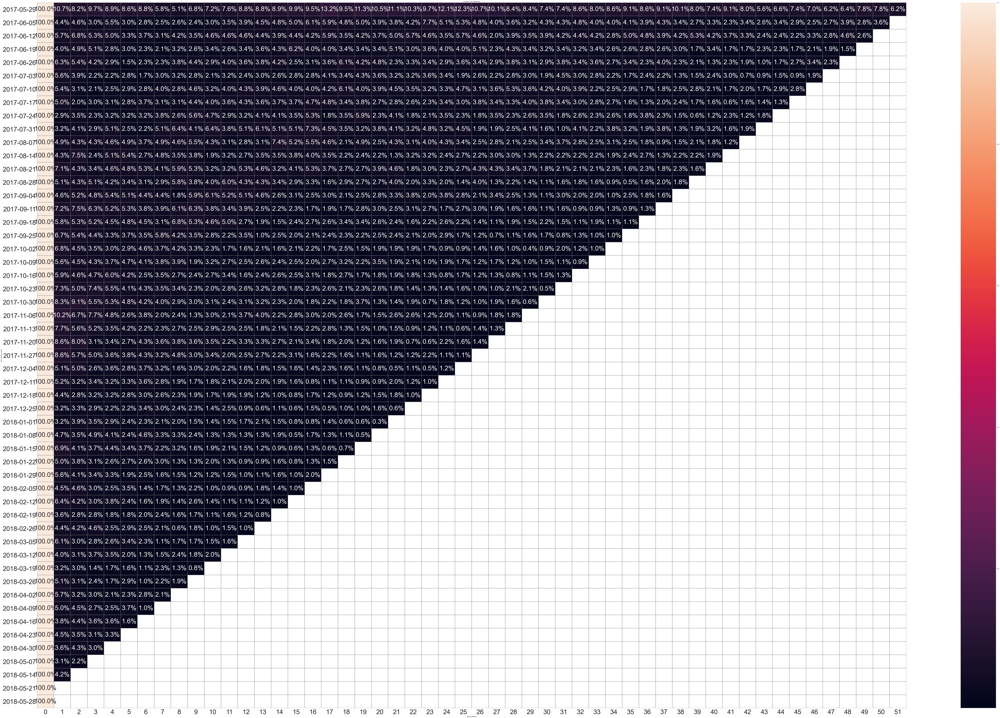

In [31]:
sns.set(style='white')
plt.figure(figsize=(150, 100))
plt.title('Cohorts: User Retention')
plt.xticks(fontsize=50)
plt.yticks(fontsize=50)
plt.rcParams['font.size'] = 50
sns.heatmap(retention_pivot, annot=True, fmt='.1%', linewidths=1, linecolor='gray');


As we see, the Retantion Rate is extremely low - after 1st week in each cohort the retention falls from 100% to 4-7% and continues falling every week. So let's check if the situation depends on the platforms:

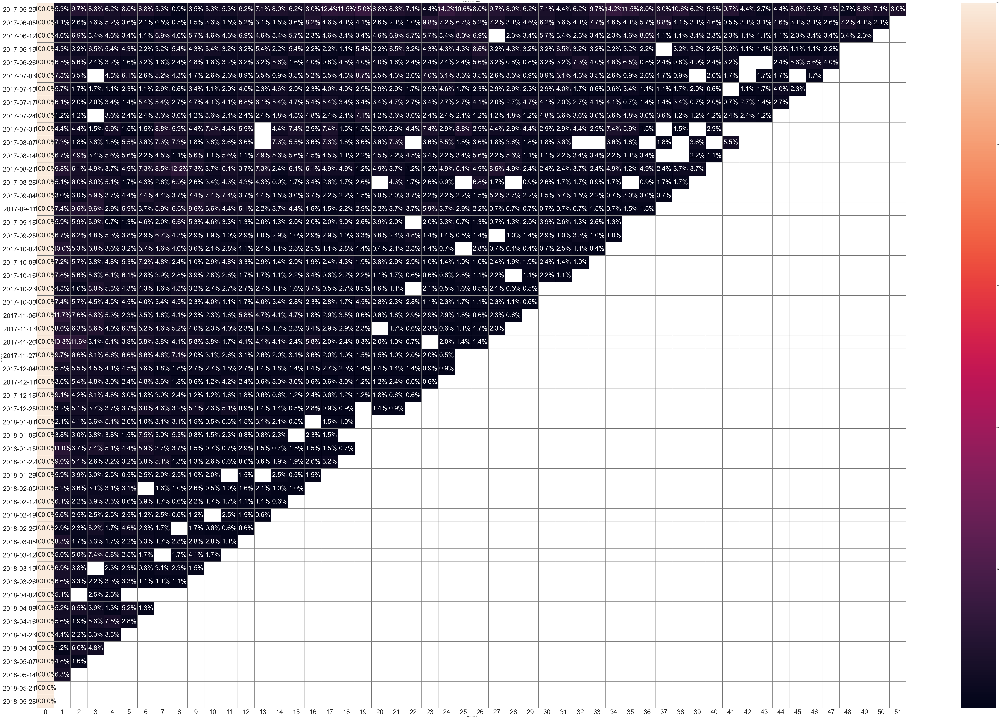

In [32]:
visits_with_orders_touch['first_activity_week'] = [time.date() for time in visits_with_orders_touch['first_activity_week']]

cohorts_touch = visits_with_orders_touch.groupby(['first_activity_week','cohort_lifetime']).agg({'Uid':'nunique'}).reset_index()

initial_users_count_touch = cohorts_touch[cohorts_touch['cohort_lifetime'] == 0][['first_activity_week','Uid']]

initial_users_count_touch = initial_users_count_touch.rename(columns={'Uid':'cohort_users'})

cohorts_touch = cohorts_touch.merge(initial_users_count_touch,on='first_activity_week')

cohorts_touch['retention'] = cohorts_touch['Uid']/cohorts_touch['cohort_users']

retention_pivot_touch = cohorts_touch.pivot_table(index='first_activity_week',columns='cohort_lifetime',values='retention',aggfunc='sum')

sns.set(style='white')
plt.figure(figsize=(150, 100))
plt.title('Cohorts: User Retention')
plt.xticks(fontsize=50)
plt.yticks(fontsize=50)
plt.rcParams['font.size'] = 50
sns.heatmap(retention_pivot_touch, annot=True, fmt='.1%', linewidths=1, linecolor='gray');

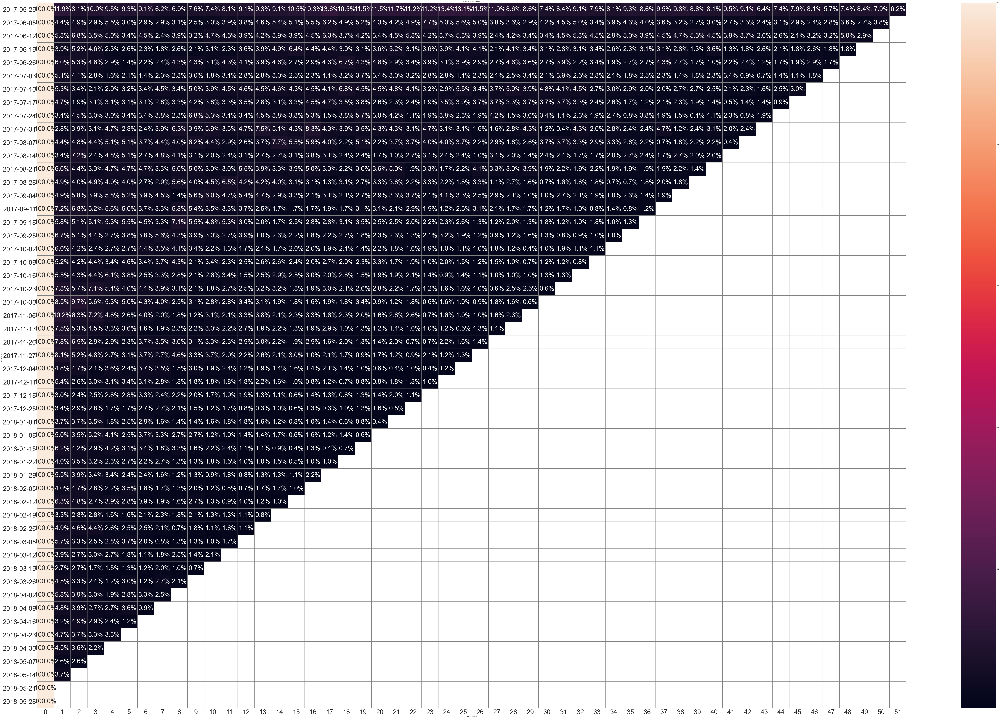

In [33]:
visits_with_orders_desktop['first_activity_week'] = [time.date() for time in visits_with_orders_desktop['first_activity_week']]

cohorts_desktop = visits_with_orders_desktop.groupby(['first_activity_week','cohort_lifetime']).agg({'Uid':'nunique'}).reset_index()

initial_users_count_desktop = cohorts_desktop[cohorts_desktop['cohort_lifetime'] == 0][['first_activity_week','Uid']]

initial_users_count_desktop = initial_users_count_desktop.rename(columns={'Uid':'cohort_users'})

cohorts_desktop = cohorts_desktop.merge(initial_users_count_desktop,on='first_activity_week')

cohorts_desktop['retention'] = cohorts_desktop['Uid']/cohorts_desktop['cohort_users']

retention_pivot_desktop = cohorts_desktop.pivot_table(index='first_activity_week',columns='cohort_lifetime',values='retention',aggfunc='sum')

sns.set(style='white')
plt.figure(figsize=(150, 100))
plt.title('Cohorts: User Retention')
plt.xticks(fontsize=50)
plt.yticks(fontsize=50)
plt.rcParams['font.size'] = 50
sns.heatmap(retention_pivot_desktop, annot=True, fmt='.1%', linewidths=1, linecolor='gray');

**Conclusion:** the Retantion Rate is extremely low - after 1st week in each cohort the retention falls from 100% to 4-7% and continues falling every week and it doesn't depend on platform

[Back to the beginning of Part 2](#2-bullet)

-------------------

## Sales <a class="anchor" id="22-bullet"></a>

In this part we will answer the following questions:

- When do people start buying? What is the time that elapses between registration and conversion — when the user becomes a customer?
- How many orders do they make during a given period of time?
- What is the average purchase size?
- How much money do they bring? (LTV)

In [34]:
visits.time_to_order.describe()

count                         97394
mean     33 days 17:25:12.528697796
std      63 days 08:19:13.634574715
min                 0 days 00:00:00
25%                 0 days 00:10:00
50%                 1 days 00:17:00
75%                36 days 23:11:00
max               363 days 07:04:00
Name: time_to_order, dtype: object

As we see 25% of users make purchases after only 10 minutes after starting their 1st session, 50% of users make purchases before 1 day 17 minutes after their 1st session which is pretty fast! A half of other users finally make their purchases after 1month and a week.

In [35]:
visits[visits['Device'] == 'touch'].time_to_order.describe()

count                         19236
mean     34 days 14:09:42.760449192
std      63 days 04:19:11.959414905
min                 0 days 00:00:00
25%                 0 days 00:10:00
50%                 1 days 06:32:30
75%                41 days 20:18:00
max               362 days 16:47:00
Name: time_to_order, dtype: object

In [36]:
visits[visits['Device'] == 'desktop'].time_to_order.describe()

count                         78158
mean     33 days 12:18:54.927198748
std      63 days 09:16:11.055487741
min                 0 days 00:00:00
25%                 0 days 00:09:00
50%                 0 days 23:39:00
75%                35 days 18:34:45
max               363 days 07:04:00
Name: time_to_order, dtype: object

**Conclusion:** As we see, desktop users are "faster" in general:
- 25%:
    - desktop - 9 min, touch - 10 min
- 50%:
    - desktop - 1 day, touch - 1day 7 min
- 75%:
    - desktop - 36 days, touch - 42 days

In [37]:
# print to remind
orders.head()

,Buy Ts,Revenue,Uid,order_date
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01


Let's now find the ammount of orders our clients make during a given period of time. Since we have 2 platforms - touch and desktop we will devide the data:

In [38]:
visits_touch = visits[visits['Device'] == 'touch'].Uid
visits_desktop = visits[visits['Device'] == 'desktop'].Uid

orders_touch = orders.query('Uid in @visits_touch')
orders_desktop = orders.query('Uid in @visits_desktop')

print(orders_touch.head(), '\n')
print(orders_desktop.head())

                Buy Ts  Revenue                   Uid  order_date
7  2017-06-01 09:22:00     1.22   3644482766749211722  2017-06-01
17 2017-06-01 10:58:00     3.73  11062788618907079633  2017-06-01
27 2017-06-01 14:22:00     0.18  13128309044400650573  2017-06-01
38 2017-06-01 17:16:00     1.53   5603453646174104178  2017-06-01
39 2017-06-01 17:19:00     0.55   7939977454700153907  2017-06-01 

               Buy Ts  Revenue                   Uid  order_date
0 2017-06-01 00:10:00    17.00  10329302124590727494  2017-06-01
1 2017-06-01 00:25:00     0.55  11627257723692907447  2017-06-01
2 2017-06-01 00:27:00     0.37  17903680561304213844  2017-06-01
3 2017-06-01 00:29:00     0.55  16109239769442553005  2017-06-01
4 2017-06-01 07:58:00     0.37  14200605875248379450  2017-06-01


   order_date  n_orders  n_users
0  2017-06-01        96       86
1  2017-06-02       111      101
2  2017-06-03        67       61
3  2017-06-04        66       59
4  2017-06-05       161      146


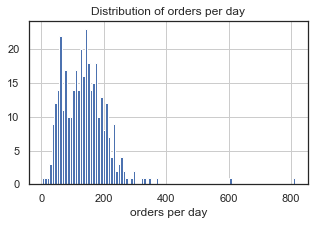

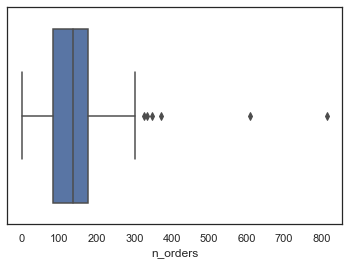

Average ammount of orders per day: 138.5
Median ammount of orders per day: 136.0


In [39]:
orders_per_day = orders.groupby(['order_date']).agg({'Uid': ['count','nunique']})
orders_per_day = orders_per_day.reset_index()
orders_per_day.columns = ['order_date', 'n_orders', 'n_users']
print(orders_per_day.head())

orders_per_day.n_orders.hist(bins = 100, figsize = (5, 3))

plt.xlabel('orders per day')
plt.title('Distribution of orders per day')
plt.show()

fig, axes = plt.subplots(figsize=(6, 4))
sns.boxplot(x = 'n_orders', data=orders_per_day)
plt.show()

print("Average ammount of orders per day:", round(orders_per_day.n_orders.mean(), 2))
print("Median ammount of orders per day:", round(orders_per_day.n_orders.median(), 2))

Let's now find this value for the platforms:

  touch_order_date  n_orders  n_users
0       2017-06-01        21       19
1       2017-06-02        19       18
2       2017-06-03        22       18
3       2017-06-04        16       15
4       2017-06-05        42       37


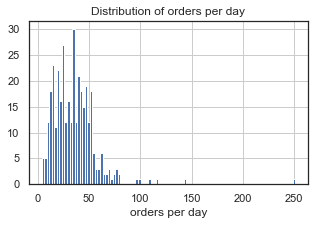

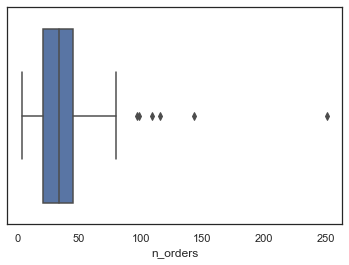

Average ammount of touch-orders per day: 35.12
Median ammount of touch-orders per day: 34.0


In [40]:
orders_per_day_touch = orders_touch.groupby(['order_date']).agg({'Uid': ['count','nunique']})
orders_per_day_touch = orders_per_day_touch.reset_index()
orders_per_day_touch.columns = ['touch_order_date', 'n_orders', 'n_users']
print(orders_per_day_touch.head())

orders_per_day_touch.n_orders.hist(bins = 100, figsize = (5, 3))

plt.xlabel('orders per day')
plt.title('Distribution of orders per day')
plt.show()

fig, axes = plt.subplots(figsize=(6, 4))
sns.boxplot(x = 'n_orders', data=orders_per_day_touch)
plt.show()

print("Average ammount of touch-orders per day:", round(orders_per_day_touch.n_orders.mean(), 2))
print("Median ammount of touch-orders per day:", round(orders_per_day_touch.n_orders.median(), 2))

  desktop_order_date  n_orders  n_users
0         2017-06-01        87       78
1         2017-06-02       100       90
2         2017-06-03        54       51
3         2017-06-04        56       49
4         2017-06-05       145      131


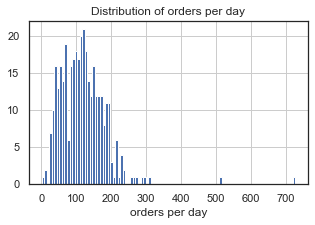

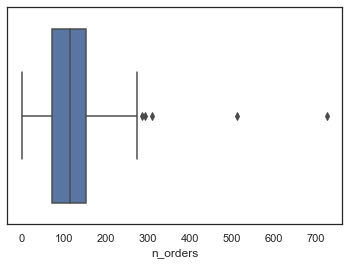

Average ammount of desktop-orders per day: 118.65
Median ammount of desktop-orders per day: 114.0


In [41]:
orders_per_day_desktop = orders_desktop.groupby(['order_date']).agg({'Uid': ['count','nunique']})
orders_per_day_desktop = orders_per_day_desktop.reset_index()
orders_per_day_desktop.columns = ['desktop_order_date', 'n_orders', 'n_users']
print(orders_per_day_desktop.head())

orders_per_day_desktop.n_orders.hist(bins = 100, figsize = (5, 3))

plt.xlabel('orders per day')
plt.title('Distribution of orders per day')
plt.show()

fig, axes = plt.subplots(figsize=(6, 4))
sns.boxplot(x = 'n_orders', data=orders_per_day_desktop)
plt.show()

print("Average ammount of desktop-orders per day:", round(orders_per_day_desktop.n_orders.mean(), 2))
print("Median ammount of desktop-orders per day:", round(orders_per_day_desktop.n_orders.median(), 2))

**Conclusion:** All the distributions are close to normal so our mean values are close to medians and they show that ammount of desktop-orders per day is greater then this ammount of touch-ourders but we saw that there are more desktop users then touch users so let's find ammount of orders per user:

                 Uid  n_touch_orders
0   1575281904278712               2
1   3077748354309989               1
2   4992223027560440               1
3  12695041396440380               2
4  15930622431697628               1


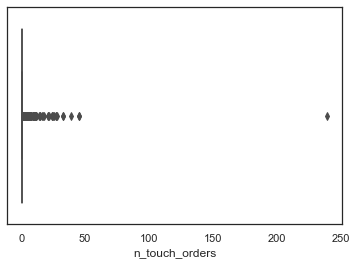

Average ammount of touch-orders per user: 1.43
Median ammount of touch-orders per user: 1.0


In [42]:
orders_per_user_touch = orders_touch.groupby(['Uid']).agg({'Buy Ts': ['count']})
orders_per_user_touch = orders_per_user_touch.reset_index()
orders_per_user_touch.columns = ['Uid', 'n_touch_orders']
print(orders_per_user_touch.head())

fig, axes = plt.subplots(figsize=(6, 4))
sns.boxplot(x = 'n_touch_orders', data=orders_per_user_touch)
plt.show()

print("Average ammount of touch-orders per user:", round(orders_per_user_touch.n_touch_orders.mean(), 2))
print("Median ammount of touch-orders per user:", round(orders_per_user_touch.n_touch_orders.median(), 2))

                Uid  n_desktop_orders
0   313578113262317                 1
1  2429014661409475                 1
2  2464366381792757                 1
3  2551852515556206                 2
4  3605148382144603                 3


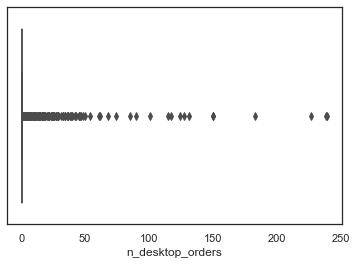

Average ammount of desktop-orders per user: 1.41
Median ammount of desktop-orders per user: 1.0


In [43]:
orders_per_user_desktop = orders_desktop.groupby(['Uid']).agg({'Buy Ts': ['count']})
orders_per_user_desktop = orders_per_user_desktop.reset_index()
orders_per_user_desktop.columns = ['Uid', 'n_desktop_orders']
print(orders_per_user_desktop.head())

fig, axes = plt.subplots(figsize=(6, 4))
sns.boxplot(x = 'n_desktop_orders', data=orders_per_user_desktop)
plt.show()

print("Average ammount of desktop-orders per user:", round(orders_per_user_desktop.n_desktop_orders.mean(), 2))
print("Median ammount of desktop-orders per user:", round(orders_per_user_desktop.n_desktop_orders.median(), 2))

**Conclusion:** Both our values are pretty close but on the boxplot diagram we see that desktop users make greater ammont of orders in general (more then 50) while for touch users 50 orders is rare thing.

Now it's time to find the average purchase size

In [44]:
orders.head()

,Buy Ts,Revenue,Uid,order_date
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01


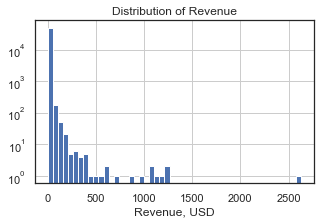

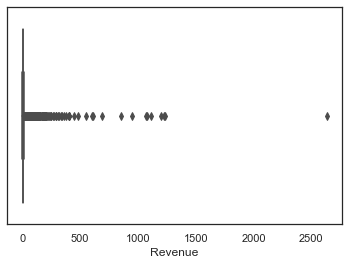

Average ammount of purchase size (Revenue): 5.0
Median ammount of purchase size (Revenue): 2.5


In [45]:
orders.Revenue.hist(bins = 50, figsize = (5, 3), log = True)

plt.xlabel('Revenue, USD')
plt.title('Distribution of Revenue')
plt.show()

fig, axes = plt.subplots(figsize=(6, 4))
sns.boxplot(x = 'Revenue', data=orders)
plt.show()

print("Average ammount of purchase size (Revenue):", round(orders.Revenue.mean(), 2))
print("Median ammount of purchase size (Revenue):", round(orders.Revenue.median(), 2))

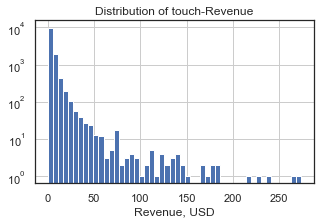

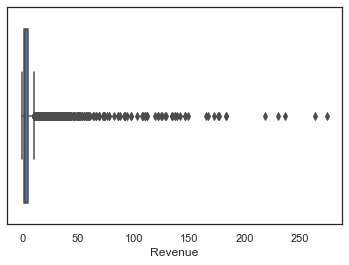

Average ammount of touch-purchase size (Revenue): 4.79
Median ammount of touch-purchase size (Revenue): 2.44


In [46]:
orders_touch.Revenue.hist(bins = 50, figsize = (5, 3), log = True)

plt.xlabel('Revenue, USD')
plt.title('Distribution of touch-Revenue')
plt.show()

fig, axes = plt.subplots(figsize=(6, 4))
sns.boxplot(x = 'Revenue', data=orders_touch)
plt.show()

print("Average ammount of touch-purchase size (Revenue):", round(orders_touch.Revenue.mean(), 2))
print("Median ammount of touch-purchase size (Revenue):", round(orders_touch.Revenue.median(), 2))

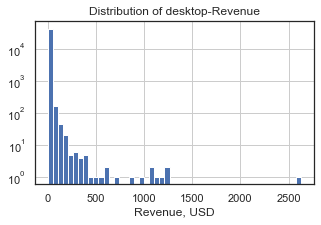

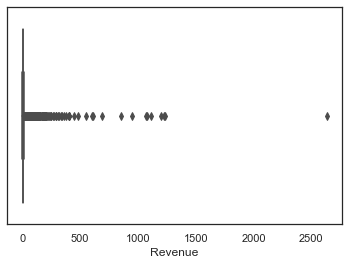

Average ammount of desktop-purchase size (Revenue): 5.2
Median ammount of desktop-purchase size (Revenue): 2.69


In [47]:
orders_desktop.Revenue.hist(bins = 50, figsize = (5, 3), log = True)

plt.xlabel('Revenue, USD')
plt.title('Distribution of desktop-Revenue')
plt.show()

fig, axes = plt.subplots(figsize=(6, 4))
sns.boxplot(x = 'Revenue', data=orders_desktop)
plt.show()

print("Average ammount of desktop-purchase size (Revenue):", round(orders_desktop.Revenue.mean(), 2))
print("Median ammount of desktop-purchase size (Revenue):", round(orders_desktop.Revenue.median(), 2))

**Conclusion:** The distributions are far from normal so the median values are more correct. Median ammount of desktop-purchase size is greater then Median ammount of touch-purchase size (2.69 and 2.44)

Now we will count the LTV parameter starting with the distribution of order and costs dates:

In [48]:
orders['Buy Ts'].describe()

count                   50415
unique                  45991
top       2018-05-31 10:13:00
freq                        9
first     2017-06-01 00:10:00
last      2018-06-01 00:02:00
Name: Buy Ts, dtype: object

In [49]:
costs['dt'].describe()

count                    2542
unique                    364
top       2018-03-03 00:00:00
freq                        7
first     2017-06-01 00:00:00
last      2018-05-31 00:00:00
Name: dt, dtype: object

In [50]:
costs.head()

,source_id,dt,costs
0,1,2017-06-01,75.20
1,1,2017-06-02,62.25
2,1,2017-06-03,36.53
3,1,2017-06-04,55.00
4,1,2017-06-05,57.08


In [51]:
orders.head()

,Buy Ts,Revenue,Uid,order_date
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01


The range of expense dates coincides with that of order dates. Calculating LTV by cohort is convenient. We have data for almost a year. It'll be best to make monthly cohorts. Let's capture the months from the dates in the tables of orders and costs:

In [52]:
orders['order_month'] = orders['order_date'].astype('datetime64[M]')
costs['month'] = costs['dt'].astype('datetime64[M]') 

orders_touch['order_month'] = orders_touch['order_date'].astype('datetime64[M]')
orders_desktop['order_month'] = orders_desktop['order_date'].astype('datetime64[M]')

first_orders = orders.groupby('Uid').agg({'order_month' : 'min'}).reset_index()
first_orders.columns = ['Uid', 'first_order_month']
print("First orders:", '\n')
print(first_orders.head(10))

first_orders_touch = orders_touch.groupby('Uid').agg({'order_month' : 'min'}).reset_index()
first_orders_touch.columns = ['Uid', 'first_order_month']

first_orders_desktop = orders_desktop.groupby('Uid').agg({'order_month' : 'min'}).reset_index()
first_orders_desktop.columns = ['Uid', 'first_order_month']

First orders: 

                Uid first_order_month
0   313578113262317        2018-01-01
1  1575281904278712        2017-06-01
2  2429014661409475        2017-10-01
3  2464366381792757        2018-01-01
4  2551852515556206        2017-11-01
5  3077748354309989        2018-03-01
6  3605148382144603        2017-09-01
7  3753586865891862        2018-03-01
8  4808417689019433        2018-01-01
9  4992223027560440        2018-04-01


We'll calculate the number of new customers (n_buyers) for each month:

In [53]:
cohort_sizes = first_orders.groupby('first_order_month').agg({'Uid': 'nunique'}).reset_index()
cohort_sizes.columns = ['first_order_month', 'n_buyers']
cohort_sizes 

,first_order_month,n_buyers
0,2017-06-01,2023
1,2017-07-01,1923
2,2017-08-01,1370
3,2017-09-01,2581
4,2017-10-01,4340
5,2017-11-01,4081
6,2017-12-01,4383
7,2018-01-01,3373
8,2018-02-01,3651
9,2018-03-01,3533


Let's build cohorts. We'll add customers' first-purchase months to the table of orders:

In [54]:
orders_ = pd.merge(orders,first_orders, on='Uid')
orders_.head()

,Buy Ts,Revenue,Uid,order_date,order_month,first_order_month
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01,2017-06-01,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01,2017-06-01,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01,2017-06-01,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01,2017-06-01,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01,2017-06-01,2017-06-01


Now we'll group the table of orders by month of first purchase and month of purchase and sum up the revenue

In [55]:
cohorts = orders_.groupby(['first_order_month','order_month']).agg({'Revenue': 'sum'}).reset_index()
cohorts.head(10)

,first_order_month,order_month,Revenue
0,2017-06-01,2017-06-01,9557.49
1,2017-06-01,2017-07-01,981.82
2,2017-06-01,2017-08-01,885.34
3,2017-06-01,2017-09-01,1931.30
4,2017-06-01,2017-10-01,2068.58
5,2017-06-01,2017-11-01,1487.92
6,2017-06-01,2017-12-01,1922.74
7,2017-06-01,2018-01-01,1176.56
8,2017-06-01,2018-02-01,1119.15
9,2017-06-01,2018-03-01,1225.51


For purposes of cohort analysis, LTV is a cohort's cumulative revenue, accounting for the number of people in the cohort. Let's add data on how many users made their first purchases in each month to the cohorts table:

In [56]:
report = pd.merge(cohort_sizes, cohorts, on='first_order_month')
report.head() 

,first_order_month,n_buyers,order_month,Revenue
0,2017-06-01,2023,2017-06-01,9557.49
1,2017-06-01,2023,2017-07-01,981.82
2,2017-06-01,2023,2017-08-01,885.34
3,2017-06-01,2023,2017-09-01,1931.30
4,2017-06-01,2023,2017-10-01,2068.58


Earlier a column with new customers appeared in the table: n_buyers. The first five values in this column are the same, since they all concern the same cohort.
Just two more steps and we'll have LTV. First, since LTV is calculated on the basis of gross profit rather than revenue, we need to find the gross profit by multiplying revenue by profitability. Second, LTV is a relative parameter, and it's easier to study for "mature" cohorts, so let's make the columns show the cohort's age instead of the month of the order.


In [57]:
report['gp'] = report['Revenue']
report['age'] = (report['order_month'] - report['first_order_month']) / np.timedelta64(1, 'M')
report['age'] = report['age'].round().astype('int')

report.head() 

,first_order_month,n_buyers,order_month,Revenue,gp,age
0,2017-06-01,2023,2017-06-01,9557.49,9557.49,0
1,2017-06-01,2023,2017-07-01,981.82,981.82,1
2,2017-06-01,2023,2017-08-01,885.34,885.34,2
3,2017-06-01,2023,2017-09-01,1931.30,1931.30,3
4,2017-06-01,2023,2017-10-01,2068.58,2068.58,4


To calculate LTV we'll divide the cohort's gross profit for each month by the total number of users in each cohort: 

In [58]:
report['ltv'] = report['gp'] / report['n_buyers']

output = report.pivot_table(
    index='first_order_month', 
    columns='age', 
    values='ltv', 
    aggfunc='mean')

output = output.cumsum(axis=1).round(2)
output.fillna('')

age,0,1,2,3,4,5,6,7,8,9,10,11
first_order_month,,,,,,,,,,,,
2017-06-01,4.72,5.21,5.65,6.6,7.62,8.36,9.31,9.89,10.45,11.05,11.62,11.88
2017-07-01,6.01,6.35,6.97,7.33,7.5,7.66,7.78,7.92,8.08,8.23,8.39,
2017-08-01,5.28,5.75,6.21,6.6,7.09,7.38,7.59,7.99,8.28,8.47,,
2017-09-01,5.64,6.76,7.28,11.26,11.66,12.31,13.01,13.25,13.44,,,
2017-10-01,5.00,5.54,5.73,5.89,6.04,6.16,6.24,6.36,,,,
2017-11-01,5.15,5.55,5.75,6.08,6.23,6.28,6.4,,,,,
2017-12-01,4.74,5,5.92,6.99,7.3,7.64,,,,,,
2018-01-01,4.14,4.43,4.73,4.88,4.94,,,,,,,
2018-02-01,4.16,4.44,4.51,4.59,,,,,,,,


In [59]:
output = output.reset_index()

ltv_3rd_month = output[2].head(10).mean()
print('Average ltv by 3rd month:', round(ltv_3rd_month, 2))
print()
ltv_6th_month = output[5].head(7).mean()
print('Average ltv by 6th month:', round(ltv_6th_month, 2))
print()
ltv_9th_month = output[8].head(4).mean()
print('Average ltv by 9th month:',round(ltv_9th_month, 2))

Average ltv by 3rd month: 5.82

Average ltv by 6th month: 7.97

Average ltv by 9th month: 10.06


We see that in each cohort LTV is increasing from month to month, so the average LTV by 3rd month is 5.82 USD, by 6th month - 7.97 USD and by 9th month - 10.06 USD. Let's find this parameter for both platforms:

In [60]:
cohort_sizes_touch = first_orders_touch.groupby('first_order_month').agg({'Uid': 'nunique'}).reset_index()
cohort_sizes_touch.columns = ['first_order_month', 'n_buyers']

orders_touch_ = pd.merge(orders_touch,first_orders_touch, on='Uid')

cohorts_touch = orders_touch_.groupby(['first_order_month','order_month']).agg({'Revenue': 'sum'}).reset_index()

report_touch = pd.merge(cohort_sizes_touch, cohorts_touch, on='first_order_month')

report_touch['gp'] = report_touch['Revenue'] #* margin_rate
report_touch['age'] = (report_touch['order_month'] - report_touch['first_order_month']) / np.timedelta64(1, 'M')
report_touch['age'] = report_touch['age'].round().astype('int')

report_touch['ltv'] = report_touch['gp'] / report_touch['n_buyers']

output_touch = report_touch.pivot_table(
    index='first_order_month', 
    columns='age', 
    values='ltv', 
    aggfunc='mean')

output_touch = output_touch.cumsum(axis=1).round(2)
print(output_touch.fillna(''))
print()
output_touch = output_touch.reset_index()

ltv_3rd_month_touch = output_touch[2].head(10).mean()
print('Average touch-ltv by 3rd month:', round(ltv_3rd_month_touch, 2))
print()
ltv_6th_month_touch = output_touch[5].head(7).mean()
print('Average touch-ltv by 6th month:',round(ltv_6th_month_touch, 2))
print()
ltv_9th_month_touch = output_touch[8].head(4).mean()
print('Average touch-ltv by 9th month:',round(ltv_9th_month_touch, 2))

age                  0     1     2     3      4      5      6     7      8   \
first_order_month                                                             
2017-06-01         4.18  4.81  5.14  5.62   7.84   8.66   9.58  9.95  10.46   
2017-07-01         6.58  7.05  7.97   8.7   9.04   9.22   9.31   9.5   9.93   
2017-08-01         5.43  5.82  6.15  6.37   6.79   7.09   7.22  7.53   8.15   
2017-09-01         6.02  7.79  8.79  9.42  10.12  10.39  11.74    12  12.16   
2017-10-01         5.33  6.23  6.36  6.47   6.62   6.73   6.78  6.91          
2017-11-01         6.37  6.86  7.07  7.69   7.92   7.99   8.03                
2017-12-01         4.15  4.31  4.43  4.53   4.57   4.61                       
2018-01-01         4.42  4.59  4.72  5.06    5.1                              
2018-02-01         4.13  4.42  4.46   4.5                                     
2018-03-01         5.56  6.26  6.53                                           
2018-04-01         4.45   4.7                       

In [61]:
cohort_sizes_desktop = first_orders_desktop.groupby('first_order_month').agg({'Uid': 'nunique'}).reset_index()
cohort_sizes_desktop.columns = ['first_order_month', 'n_buyers']

orders_desktop_ = pd.merge(orders_desktop,first_orders_desktop, on='Uid')

cohorts_desktop = orders_desktop_.groupby(['first_order_month','order_month']).agg({'Revenue': 'sum'}).reset_index()

report_desktop = pd.merge(cohort_sizes_desktop, cohorts_desktop, on='first_order_month')

report_desktop['gp'] = report_desktop['Revenue'] #* margin_rate
report_desktop['age'] = (report_desktop['order_month'] - report_desktop['first_order_month']) / np.timedelta64(1, 'M')
report_desktop['age'] = report_desktop['age'].round().astype('int')

report_desktop['ltv'] = report_desktop['gp'] / report_desktop['n_buyers']

output_desktop = report_desktop.pivot_table(
    index='first_order_month', 
    columns='age', 
    values='ltv', 
    aggfunc='mean')

output_desktop = output_desktop.cumsum(axis=1).round(2)
print(output_desktop.fillna(''))
print()
output_desktop = output_desktop.reset_index()

ltv_3rd_month_desktop = output_desktop[2].head(10).mean()
print('Average desktop-ltv by 3rd month:', round(ltv_3rd_month_desktop, 2))
print()
ltv_6th_month_desktop = output_desktop[5].head(7).mean()
print('Average desktop-ltv by 6th month:',round(ltv_6th_month_desktop, 2))
print()
ltv_9th_month_desktop = output_desktop[8].head(4).mean()
print('Average desktop-ltv by 9th month:',round(ltv_9th_month_desktop, 2))

age                  0     1     2     3      4      5      6      7      8   \
first_order_month                                                              
2017-06-01         4.88  5.39  5.88  6.97   8.14   8.98  10.07  10.74  11.37   
2017-07-01         6.14   6.5  7.24  7.64   7.84   8.01   8.14    8.3   8.49   
2017-08-01         5.38  5.92  6.44  6.89   7.46   7.79   8.01   8.47    8.8   
2017-09-01         5.94  7.22  7.84  12.6  13.08  13.84  14.68  14.97  15.19   
2017-10-01         5.16  5.73  5.94  6.12   6.29   6.42   6.52   6.65          
2017-11-01         5.01  5.46  5.69  6.06   6.22   6.29   6.42                 
2017-12-01         4.87  5.15  6.25  7.51   7.89   8.29                        
2018-01-01         4.19  4.53  4.89  5.05   5.12                               
2018-02-01         4.23  4.55  4.64  4.73                                      
2018-03-01         4.86  5.21  5.57                                            
2018-04-01         4.72  5.34           

**Conclusion:** LTV of desktop-users is generally greater then LTV of touch-users:

    - by 3rd month:
        - desktop - 6.04, touch - 6.16
    - by 6th month:
        - desktop - 8.52, touch - 7.81
    - by 9th month:
        - desktop - 10.96, touch - 10.18

[Back to the beginning of Part 2](#2-bullet)

-----------------------

## Marketing <a class="anchor" id="23-bullet"></a>

In this part we will answer the following questions:
- How much money was spent? Overall/per source/over time
- How much did customer acquisition from each of the sources cost?
- How worthwhile where the investments? (ROI)

In [62]:
costs.sample(5)

,source_id,dt,costs,month
2280,10,2017-09-10,14.14,2017-09-01
1871,9,2017-07-26,5.60,2017-07-01
1594,5,2017-10-21,108.48,2017-10-01
1642,5,2017-12-08,174.57,2017-12-01
91,1,2017-08-31,38.26,2017-08-01


In [63]:
overall_costs = costs.costs.sum()
print(overall_costs)

329131.62


Costs for each source:

In [64]:
costs_per_source_pivot = costs.pivot_table(index ='source_id', values='costs', aggfunc = 'sum')
costs_per_source_pivot

,costs
source_id,
1,20833.27
2,42806.04
3,141321.63
4,61073.60
5,51757.10
9,5517.49
10,5822.49


Costs over time:

In [65]:
costs_over_time = costs.groupby(['dt']).agg({'costs':'sum'}).reset_index() 
costs_over_time.head()

,dt,costs
0,2017-06-01,735.26
1,2017-06-02,721.19
2,2017-06-03,450.85
3,2017-06-04,761.16
4,2017-06-05,821.44


In [66]:
costs_over_time['cumsum_costs'] = costs_over_time['costs'].cumsum()
costs_over_time.head()

,dt,costs,cumsum_costs
0,2017-06-01,735.26,735.26
1,2017-06-02,721.19,1456.45
2,2017-06-03,450.85,1907.30
3,2017-06-04,761.16,2668.46
4,2017-06-05,821.44,3489.90


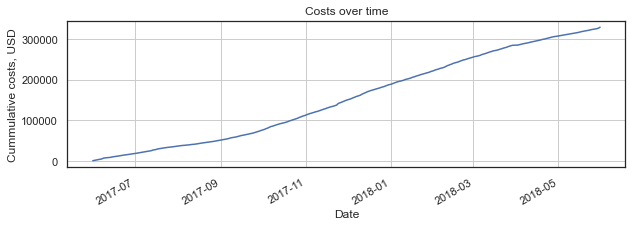

In [67]:
costs_over_time.plot(x = 'dt', y = 'cumsum_costs', legend = False, grid = True, figsize = (10, 3))
plt.xlabel('Date')
plt.ylabel('Cummulative costs, USD')
plt.title('Costs over time')
plt.show();

Costs grow over time!

Let's run calculations for all cohorts and determine the number of months each cohort requires to cover marketing expenses. We'll calculate CAC for each cohort. First we'll find the total expenses for each month, then we'll divide them by the number of customers in each cohort:

In [68]:
# calculating the costs per month
monthly_costs = costs.groupby('month').sum()
monthly_costs.head() 

,source_id,costs
month,,
2017-06-01,1020,18015.00
2017-07-01,1054,18240.59
2017-08-01,1054,14790.54
2017-09-01,1020,24368.91
2017-10-01,1054,36322.88


In [69]:
# here we add the data on costs to the report and calculate CAC

report_ = pd.merge(report, monthly_costs, left_on='first_order_month', right_on='month')
report_['cac'] = report_['costs'] / report_['n_buyers']
report_.head() 

,first_order_month,n_buyers,order_month,Revenue,gp,age,ltv,source_id,costs,cac
0,2017-06-01,2023,2017-06-01,9557.49,9557.49,0,4.724414,1020,18015.0,8.905091
1,2017-06-01,2023,2017-07-01,981.82,981.82,1,0.485329,1020,18015.0,8.905091
2,2017-06-01,2023,2017-08-01,885.34,885.34,2,0.437637,1020,18015.0,8.905091
3,2017-06-01,2023,2017-09-01,1931.30,1931.30,3,0.954671,1020,18015.0,8.905091
4,2017-06-01,2023,2017-10-01,2068.58,2068.58,4,1.022531,1020,18015.0,8.905091


In [70]:
# And now let's find ROI (return on marketing investment) by dividing LTV by CAC

report_['roi'] = report_['ltv'] / report_['cac']
output = report_.pivot_table(
    index='first_order_month', 
    columns='age', 
    values='roi', 
    aggfunc='mean')

output.cumsum(axis=1).round(2).fillna('')

age,0,1,2,3,4,5,6,7,8,9,10,11
first_order_month,,,,,,,,,,,,
2017-06-01,0.53,0.59,0.63,0.74,0.86,0.94,1.05,1.11,1.17,1.24,1.31,1.33
2017-07-01,0.63,0.67,0.73,0.77,0.79,0.81,0.82,0.84,0.85,0.87,0.88,
2017-08-01,0.49,0.53,0.57,0.61,0.66,0.68,0.7,0.74,0.77,0.78,,
2017-09-01,0.60,0.72,0.77,1.19,1.23,1.3,1.38,1.4,1.42,,,
2017-10-01,0.60,0.66,0.68,0.7,0.72,0.74,0.75,0.76,,,,
2017-11-01,0.55,0.6,0.62,0.65,0.67,0.68,0.69,,,,,
2017-12-01,0.54,0.57,0.68,0.8,0.84,0.87,,,,,,
2018-01-01,0.42,0.45,0.48,0.49,0.5,,,,,,,
2018-02-01,0.46,0.49,0.5,0.51,,,,,,,,


Let's read the report:
1.	The June cohort paid off only in the 7th month (ROI = 1.05). 
2.	The July cohort is still not paid off
3.  All other cohorts are not paid off

let's also try to find out how quickly cohorts pay off on average.

In [71]:
output.cumsum(axis=1).mean(axis=0)

age
0     0.540816
1     0.581985
2     0.631069
3     0.719740
4     0.782946
5     0.859876
6     0.896819
7     0.969951
8     1.053871
9     0.964488
10    1.094658
11    1.333982
dtype: float64

On average, cohorts pay off toward the end of the 10th month.

Now it's time to recomend resourses and platforms.
Let's start with resources. We want to find out how much customers each of the resources brings, how much does each customer's aqusition cost to the company (CAC) and how much of the customers brought make their purchases (CR)

In [72]:
visits.head()

,Device,End Ts,Source Id,Start Ts,Uid,session_year,session_month,session_week,session_date,session_duration_sec,first_session_datetime,first_order_datetime,time_to_order
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017,12,51,2017-12-20,1080,2017-12-20 17:20:00,NaT,NaT
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018,2,8,2018-02-19,1680,2018-02-19 16:53:00,NaT,NaT
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017,7,26,2017-07-01,0,2017-07-01 01:54:00,NaT,NaT
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018,5,20,2018-05-20,1440,2018-03-09 20:05:00,2018-03-09 20:25:00,0 days 00:20:00
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017,12,52,2017-12-27,0,2017-12-27 14:06:00,NaT,NaT


In [73]:
source_funnel_pivot = visits.pivot_table(index='Source Id',values=['Uid','first_order_datetime'],aggfunc='count')
source_funnel_pivot = source_funnel_pivot.reset_index()
source_funnel_pivot.columns = ['source_id', 'number_of_users', 'number_of_purchases']
source_funnel_pivot = source_funnel_pivot.merge(costs_per_source_pivot,on='source_id')
source_funnel_pivot

,source_id,number_of_users,number_of_purchases,costs
0,1,34121,16153,20833.27
1,2,47626,19063,42806.04
2,3,85610,18001,141321.63
3,4,101794,22011,61073.60
4,5,66905,14808,51757.10
5,9,13277,4794,5517.49
6,10,10025,2563,5822.49


In [74]:
source_funnel_pivot['CAC'] = source_funnel_pivot['costs'] / source_funnel_pivot['number_of_users']
source_funnel_pivot['CR'] = source_funnel_pivot['number_of_purchases'] / source_funnel_pivot['number_of_users'] * 100
source_funnel_pivot

,source_id,number_of_users,number_of_purchases,costs,CAC,CR
0,1,34121,16153,20833.27,0.610570,47.340348
1,2,47626,19063,42806.04,0.898796,40.026456
2,3,85610,18001,141321.63,1.650761,21.026749
3,4,101794,22011,61073.60,0.599972,21.623082
4,5,66905,14808,51757.10,0.773591,22.132875
5,9,13277,4794,5517.49,0.415568,36.107554
6,10,10025,2563,5822.49,0.580797,25.566085


In [75]:
print(source_funnel_pivot[['source_id', 'number_of_users']].sort_values(by = 'number_of_users', ascending = False), '\n')
print(source_funnel_pivot[['source_id', 'CAC']].sort_values(by = 'CAC'), '\n')
print(source_funnel_pivot[['source_id', 'CR']].sort_values(by = 'CR', ascending = False), '\n')
print(source_funnel_pivot[['source_id', 'costs']].sort_values(by = 'costs'), '\n')

   source_id  number_of_users
3          4           101794
2          3            85610
4          5            66905
1          2            47626
0          1            34121
5          9            13277
6         10            10025 

   source_id       CAC
5          9  0.415568
6         10  0.580797
3          4  0.599972
0          1  0.610570
4          5  0.773591
1          2  0.898796
2          3  1.650761 

   source_id         CR
0          1  47.340348
1          2  40.026456
5          9  36.107554
6         10  25.566085
4          5  22.132875
3          4  21.623082
2          3  21.026749 

   source_id      costs
5          9    5517.49
6         10    5822.49
0          1   20833.27
1          2   42806.04
4          5   51757.10
3          4   61073.60
2          3  141321.63 



[Back to the beginning of Part 2](#2-bullet)

[Back to table of contents](#0-bullet)

# Conclusion <a class="anchor" id="3-bullet"></a>

As we see in the end of previous part: 
- sources 4, 3 and 5 bring us the biggest ammounts of users while 1, 9 and 10 bring us the lowes.
- sources 4, 10 and 9 have the lowest CAC parametr while sources 3, 2 and 5 cost us the most.
- sources 1, 2 and 9 show us the highest conversion rates while 5, 4 and 4 show us the least.

All of the sources have their pros and cons but in the end of the day **few of theese sources can be recomended**:
- **9** - this source has one of the greatest CR and the lowest CAC
- **1** - this source has acceptable CAC and the highest CR
- **10** - this source has acceptable CR and one of the lowest CAC
- **2** - this source brings acceptable ammount of customers and has one of the greatest CR. It also has one of the greatest CAC but the costs are pretty acceptable

Also there is a source **significantly lagging behind in all respects - 3**; it has the highest CAC and the lowest CR but it brings one of the greatest ammount of users which makes it one of the most expensive for the company and the most useless in case of relative values

#### Now we'll continue with the platforms:

- The ammount of desktop-users is 2.7 times greater then ammount of touch-users
- The ratio of touch-users to desktop-users is 0.37 so the ratio of their DAU, WAU and MAU grows as 0.38, 0.39 and 0.41 respectively. It means that touch-users are slightly more lean on the product.
- The percentage of 0s touch-sessions is greater then percentage of 0s desktop-sessions (14.3% and 9.9% respectively). Also the average length of not 0s touch-session is shorter then average length of not 0s desktop-session. It may depend on different factors: as we work with Yandex.Afisha it may be caused by the size of poster of an event (e.g in desktop version it may take more place of the screen and it takes more time to find important information and links/buttons)
- Desktop users are "faster" in general. This is the distribution of time till 1st purchase for both platforms:
    - 25% of users by:
        - desktop - 9 min, touch - 10 min
    - 50% of users by:
        - desktop - 1 day, touch - 1day 7 min
    - 75% of users by:
        - desktop - 36 days, touch - 42 days
- Average desktop-purchase size is greater then average touch-purchase size (2.69 vs 2.44)
- LTV of desktop-users is generally greater then LTV of touch-users:
    - by 3rd month:
        - desktop - 6.04, touch - 6.16
    - by 6th month:
        - desktop - 8.52, touch - 7.81
    - by 9th month:
        - desktop - 10.96, touch - 10.18
        
To sum up - **desktop platform is recomended**

[Back to table of contents](#0-bullet)

# Requirements <a class="anchor" id="4-bullet"></a>

In [76]:
pip freeze > requirements.txt

Note: you may need to restart the kernel to use updated packages.
